# **INSTRUCTIONS:**

1. Download the data file from [Vela Pulsar Dataset](https://drive.google.com/file/d/1wCwNoUrMRyLjL6-RouWE7sEKYJYAJe2L/view?usp=sharing) in the same directory as this colab notebook.
2. Upload the dataset to the notebook.
3. Restart session and run all.

**Note:** If there is any change in the name of the dataset while downloading it, make sure to make the change in the code line also where file name is given to avoid runtime error.


# **VELA PULSAR SIGNAL ANALYSIS**

**ABSTRACT**

This project involves the **analysis of radio signal data** from the Vela pulsar using Python in a Google Colab environment. The primary objective was to extract and study the pulsar’s periodic features from a raw voltage time series dataset. **Fast Fourier Transform (FFT)** was employed to identify dominant frequency components and generate the power spectrum. A **Dynamic Spectrum** (spectrogram) was created to visualize variations in signal intensity across time and frequency. Dedispersion was applied using a known dispersion measure (DM) to correct for interstellar medium-induced delays across frequencies. Finally, the **Pulse Profile** was obtained through signal folding, and **Gaussian fitting** was used to characterize the shape and timing of the pulsar emission. The project integrates numerical computing and signal processing techniques to demonstrate practical analysis methods used in radio astronomy.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
data= pd.read_table("New data", delim_whitespace=True, header= None)
data.head()

/tmp/ipython-input-1-394437597.py:4: FutureWarning: The 'delim_whitespace' keyword in pd.read_table is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data= pd.read_table("New data", delim_whitespace=True, header= None)


,0,1
0,-65,-5
1,-37,17
2,49,0
3,-30,-22
4,62,4


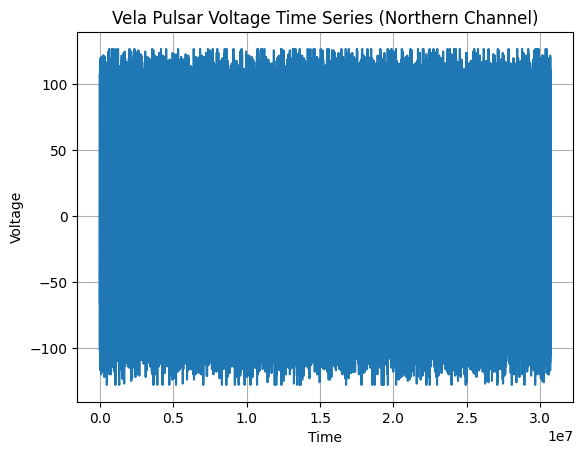

In [2]:
plt.plot(data[0])
plt.xlabel('Time')
plt.ylabel('Voltage')
plt.title('Vela Pulsar Voltage Time Series (Northern Channel)')
plt.grid(True)
plt.show()

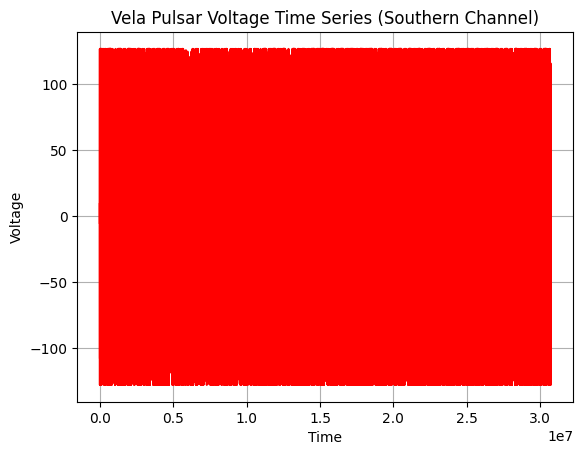

In [3]:
plt.plot(data[1], color='Red')
plt.xlabel('Time')
plt.ylabel('Voltage')
plt.title('Vela Pulsar Voltage Time Series (Southern Channel)')
plt.grid(True)
plt.show()

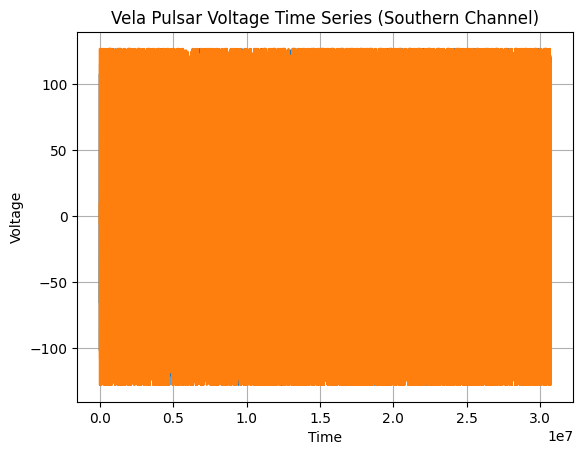

In [4]:
voltage1 = data[0]
voltage2 = data[1]
plt.plot(voltage1)
plt.plot(voltage2)
plt.xlabel('Time')
plt.ylabel('Voltage')
plt.title('Vela Pulsar Voltage Time Series (Southern Channel)')
plt.grid(True)
plt.show()

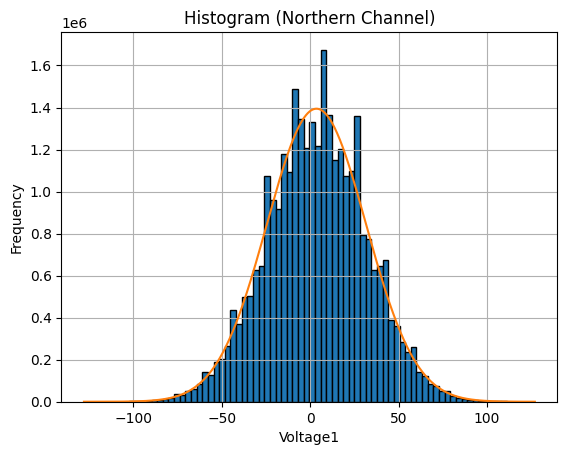

Mean of the Northern Channel is 3.48189248046875
Standard Deviation of the Northern Channel is 28.01599128999881


In [5]:
a= np.mean(voltage1)
b=np.std(voltage1)
count,bins,_ = plt.hist(voltage1, bins=80, edgecolor='black')

from scipy.stats import norm
x = np.linspace(min(bins),max(bins),1000)
pdf = norm.pdf(x, a, b)
bin_width = bins[1] - bins[0]
pdf_scaled = pdf * bin_width * len(voltage1)
plt.plot(x, pdf_scaled, label='theroetical')

plt.title('Histogram (Northern Channel)')
plt.xlabel('Voltage1')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
print("Mean of the Northern Channel is", np.mean(voltage1))
print("Standard Deviation of the Northern Channel is", np.std(voltage1))

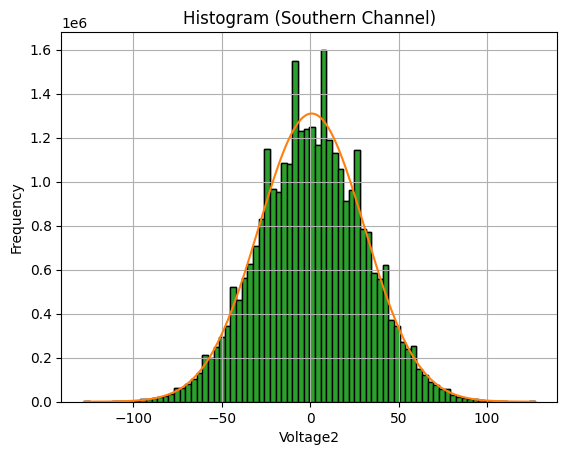

Mean of the Southern Channel is 0.7367431966145833
Standard Deviation of the Southern Channel is 29.831899519731845


In [6]:
a= np.mean(voltage2)
b=np.std(voltage2)
count,bins,_ = plt.hist(voltage2, bins=80, edgecolor='black')

from scipy.stats import norm
x = np.linspace(min(bins),max(bins),1000)
pdf = norm.pdf(x, a, b)
bin_width = bins[1] - bins[0]
pdf_scaled = pdf * bin_width * len(voltage1)
plt.plot(x, pdf_scaled, label='theroetical')
plt.hist(voltage2, bins=80, edgecolor='black')
plt.title('Histogram (Southern Channel)')
plt.xlabel('Voltage2')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
print("Mean of the Southern Channel is", np.mean(voltage2))
print("Standard Deviation of the Southern Channel is", np.std(voltage2))

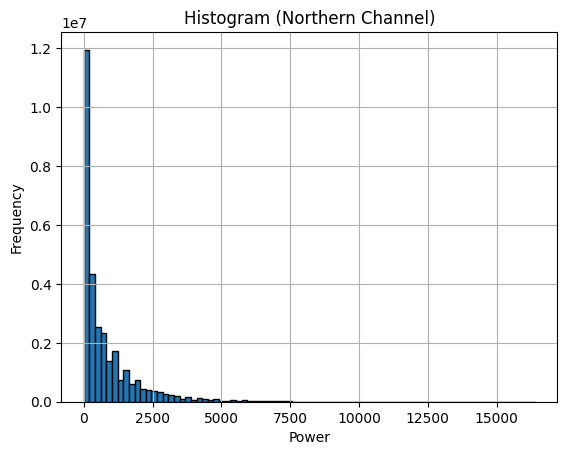

In [7]:
plt.hist(voltage1*voltage1, bins=80, edgecolor='black')
plt.title('Histogram (Northern Channel)')
plt.xlabel('Power')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


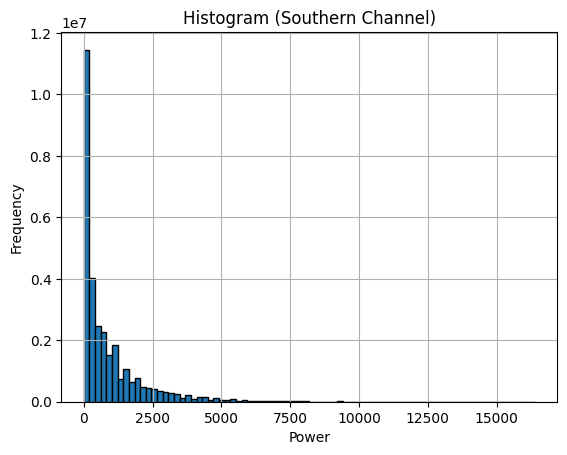

In [8]:
plt.hist(voltage2*voltage2, bins= 80, edgecolor='Black')
plt.title('Histogram (Southern Channel)')
plt.xlabel('Power')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


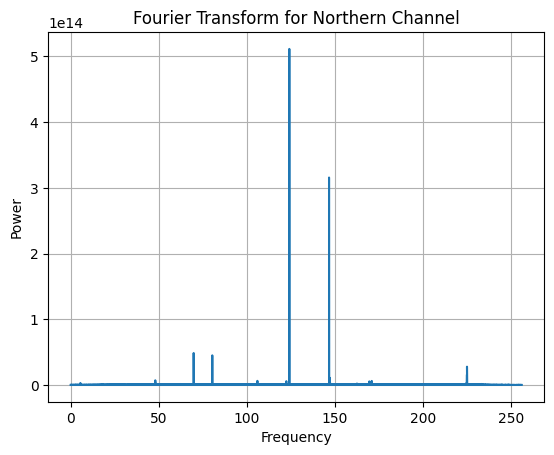

In [9]:
import scipy as sp
v1= data[0]
v2= data[1]
Fs= 512
T=1/Fs #Sampling Interval
fft_v1= np.fft.fft(v1, len(v1))
pw1= fft_v1*np.conj(fft_v1)
freq1= np.fft.fftfreq(len(v1), T)
plt.plot(freq1[1:len(v1)//2], pw1[1:len(v1)//2])
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.title('Fourier Transform for Northern Channel')
plt.grid(True)
plt.show()


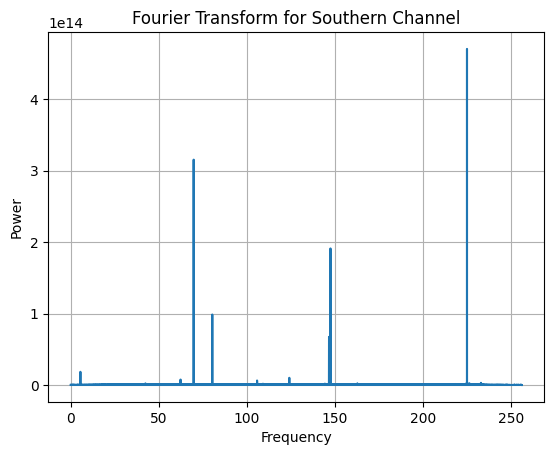

In [10]:
fft_v2= np.fft.fft(v2, len(v2))
pw2= fft_v2*np.conj(fft_v2)
freq2=np.fft.fftfreq(len(v2), T)
plt.plot(freq2[1:len(v2)//2], pw2[1:len(v2)//2])
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.title('Fourier Transform for Southern Channel')
plt.grid(True)
plt.show()

Bandwidth= 16.5MHz
Sampling Rate= 1/2*bandwidth

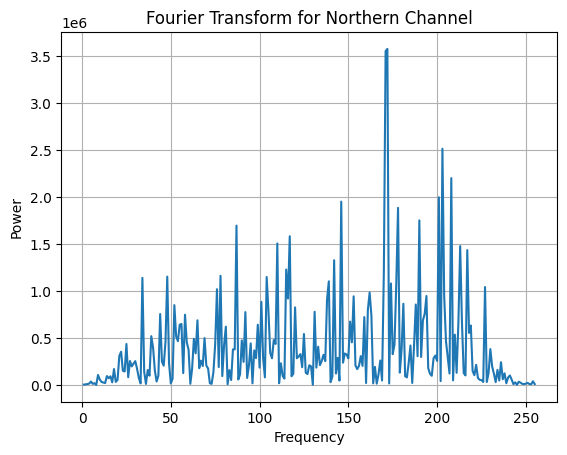

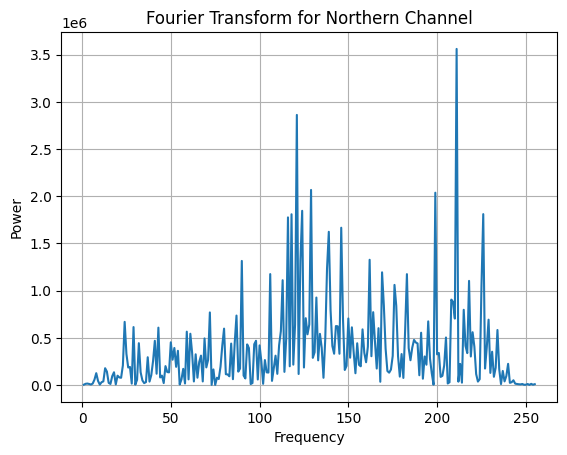

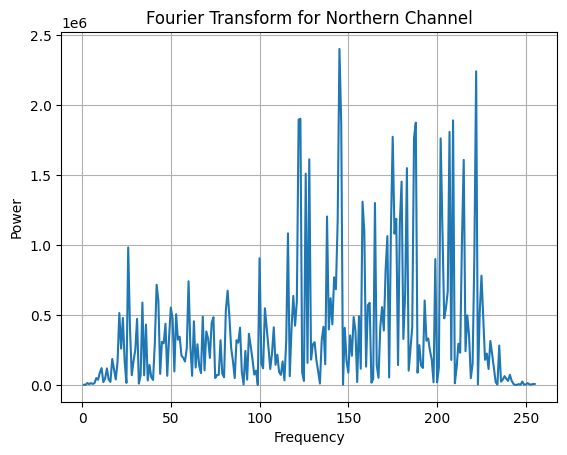

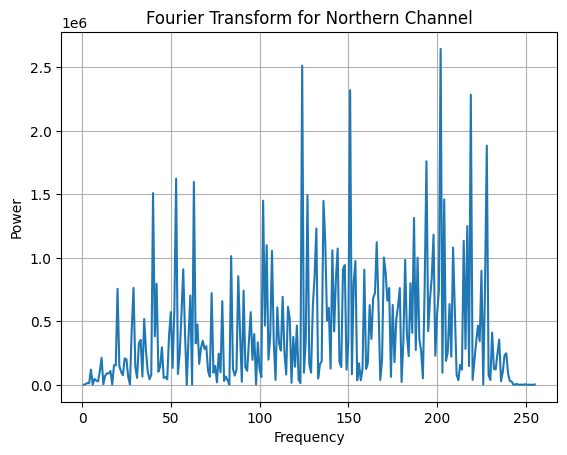

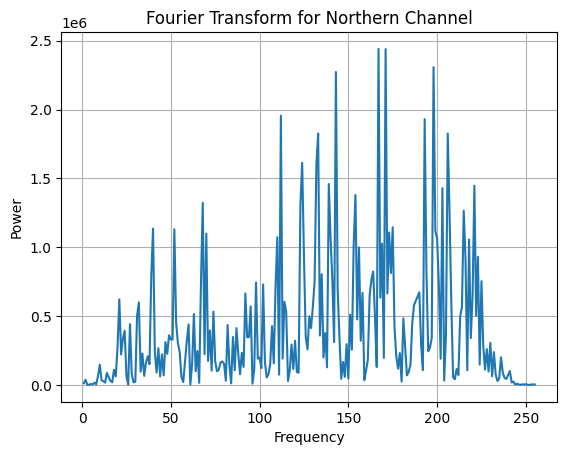

...

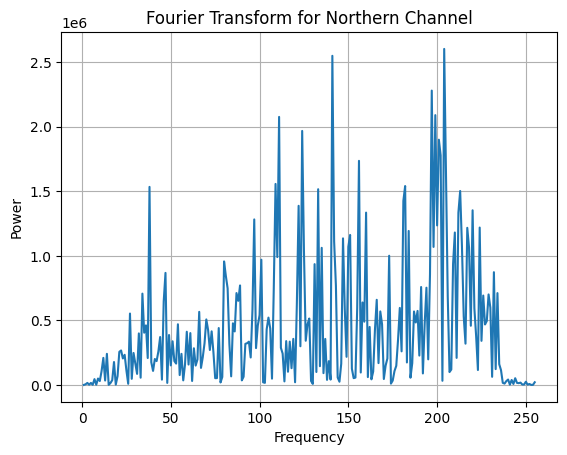

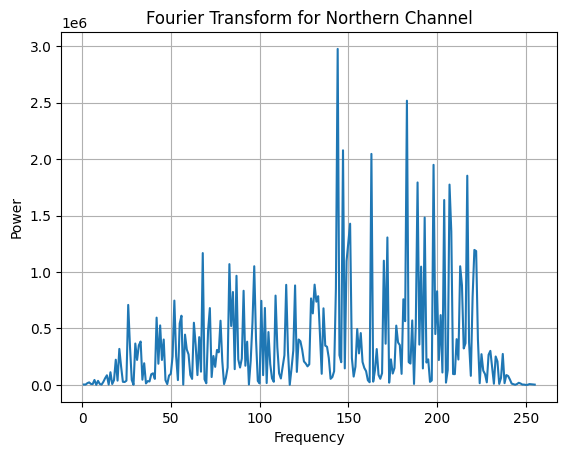

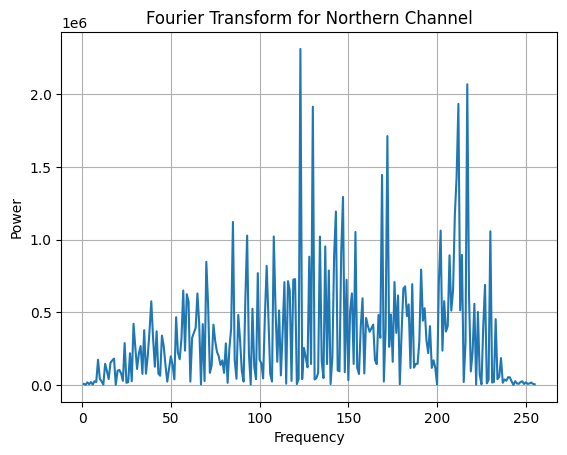

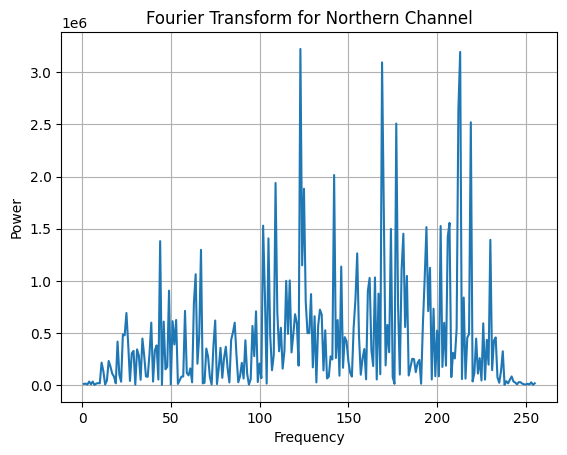

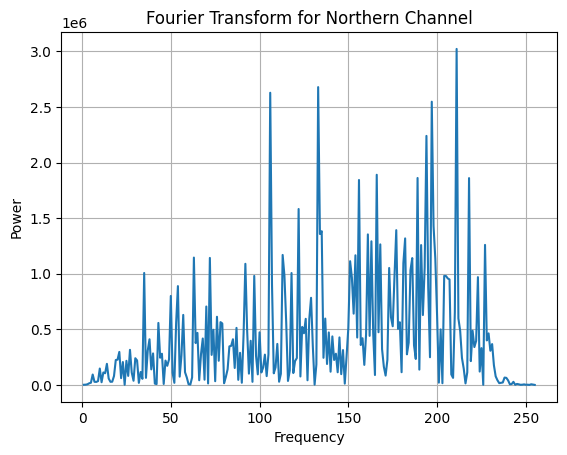

In [11]:
#for FFT (Northern Channel):
data1= data[0]
N= 512 #FFt size
block_size = 51200
fmax = 16.5e6 #bandwidth
T= 1/N #Sampling Rate
total_points= len(data1)     #Total number of data points
total_blocks= total_points//block_size #how many blocks can be made
no_of_chunks= total_blocks/N


for i in range(0, block_size, N):
  v1= data1[i:i+N] # it will consider points like [0,511], [512, 1024]
  fft_1=np.fft.fft(v1) #fft for 512 points
  pw1= fft_1*np.conj(fft_1)
  freq1=np.fft.fftfreq(N, T) #fft freq for N and sampling rate dt


  #Plot power spectrum
  plt.plot(freq1[1:len(v1)//2], pw1[1:len(v1)//2])
  plt.title('Fourier Transform for Northern Channel')
  plt.xlabel('Frequency')
  plt.ylabel('Power')
  plt.grid(True)
  plt.show()



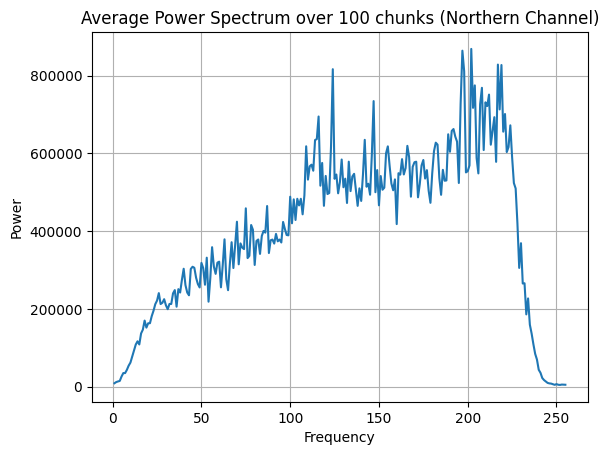

In [12]:
#Average Power Spectrum (Northern Channel)
average_power=[]
for i in range(0, block_size, N):
  v1= data1[i:i+N] # it will consider points like [0,511], [512, 1024]
  fft_1=np.fft.fft(v1) #fft for 512 points
  pw1= fft_1*np.conj(fft_1)
  freq1=np.fft.fftfreq(N, T) #fft freq for N and sampling rate dt
  average_power.append(pw1)

freq1_avg= np.fft.fftfreq(N, T)
avg_power = np.array(average_power)
pw1_avg= np.mean(avg_power, axis=0)
plt.plot(freq1_avg[1:len(v1)//2], pw1_avg[1:len(v1)//2])
plt.title('Average Power Spectrum over 100 chunks (Northern Channel)')
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.grid(True)
plt.show()

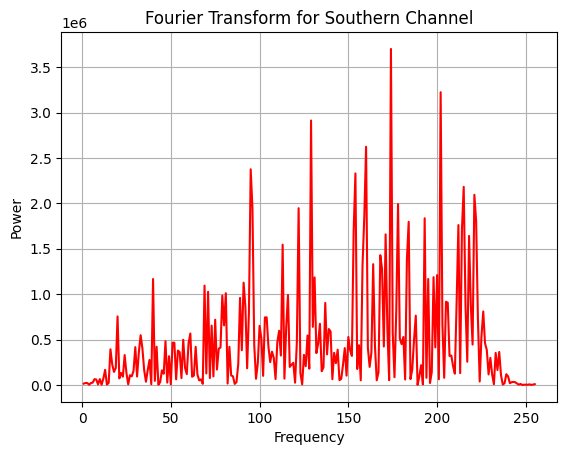

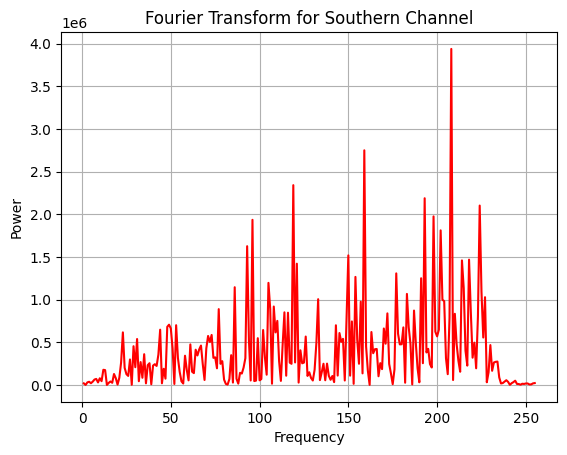

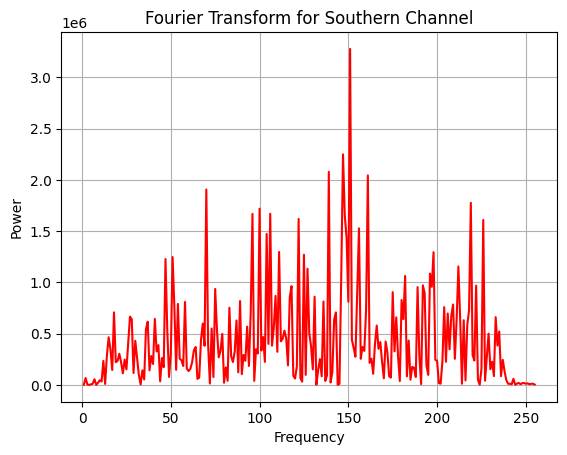

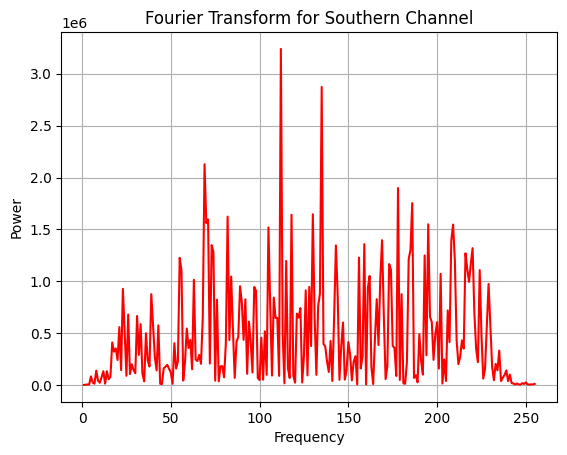

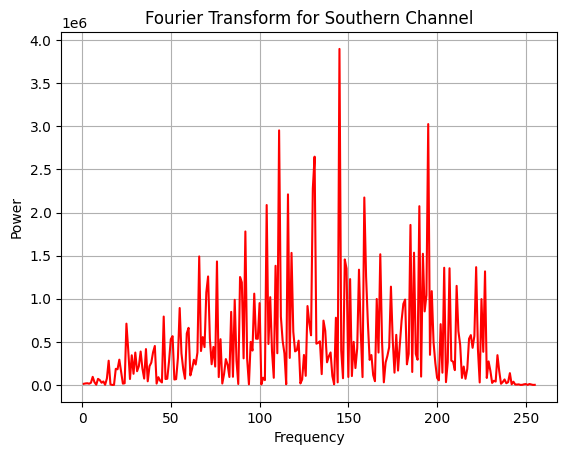

...

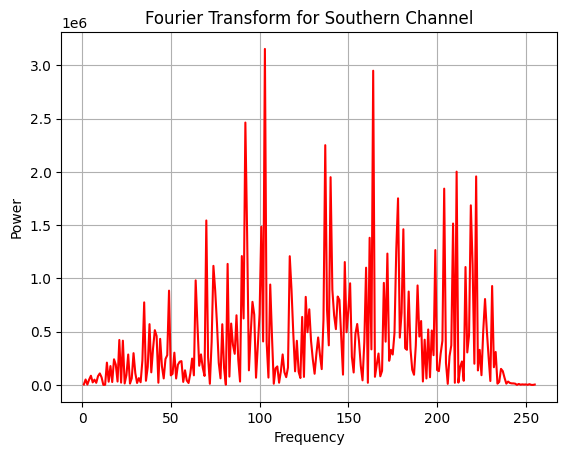

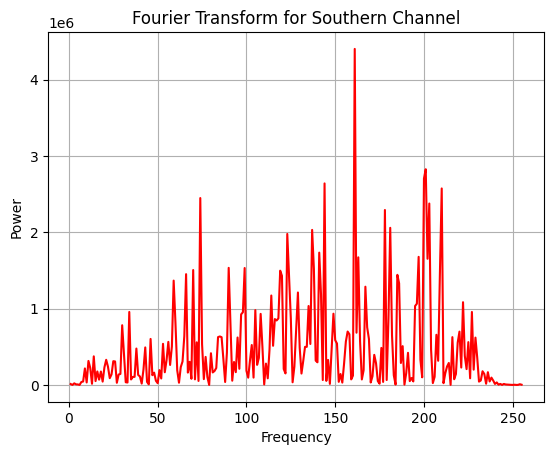

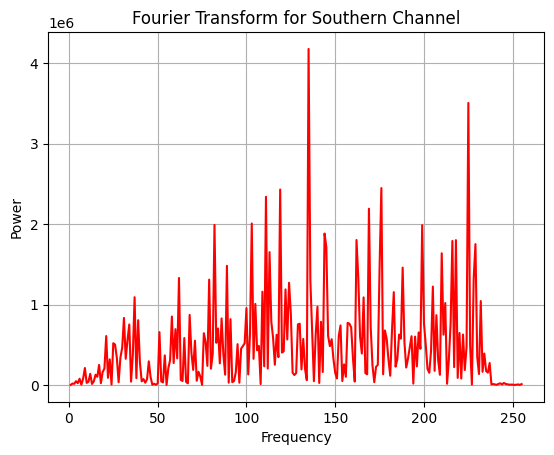

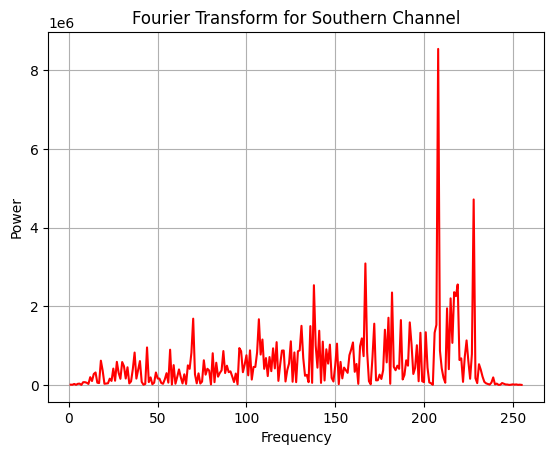

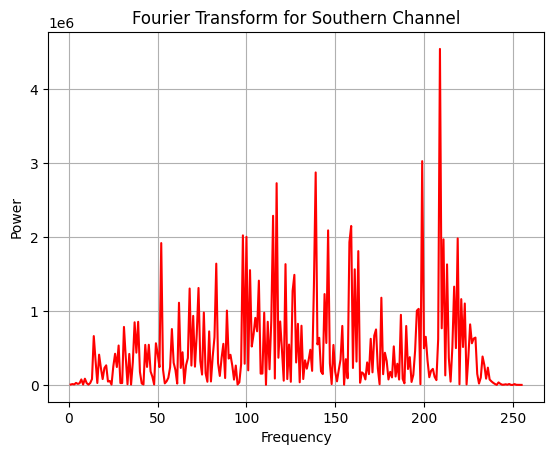

In [13]:
#For FFt (Southern Channel):
data2= data[1]
for i in range(0,block_size, N):
  v2=data2[i:i+N]
  fft_2= np.fft.fft(v2)
  pw2= fft_2*np.conj(fft_2)
  freq2= np.fft.fftfreq(N,T)
  plt.plot(freq2[1:len(v2)//2], pw2[1:len(v2)//2], color='red')
  plt.title('Fourier Transform for Southern Channel')
  plt.xlabel('Frequency')
  plt.ylabel('Power')
  plt.grid(True)
  plt.show()

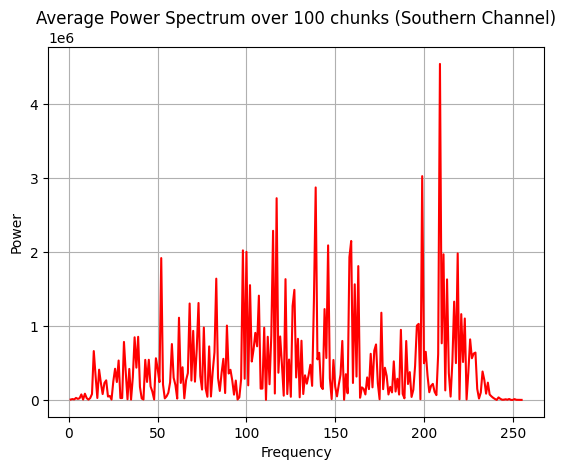

In [14]:
# Average Power Spectrum (Southern Channel)
average_power2=[]
for i in range(0, block_size, N):
  v2= data2[i:i+N]
  fft_2= np.fft.fft(v2)
  pw2= fft_2*np.conj(fft_2)
  freq2= np.fft.fftfreq(N, T)
  average_power2.append(pw2)
avg_power2= np.array(average_power2)
plt.plot(freq2[1:len(v2)//2], pw2[1:len(v2)//2], color='red')
plt.title('Average Power Spectrum over 100 chunks (Southern Channel)')
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.grid(True)
plt.show()

In [15]:
#For Dynamic Spectrum (Northern Channel)
from scipy.signal import spectrogram
fmax=16.5e6
N=512
dt= 1/(2*fmax) #Sampling Interval
df= fmax/N #Frequency resolution
T_max= 1/df #Maximum time
NFFT= int(len(data1)*T_max)
N_spectra= int(len(data1)/NFFT)
T_resolution= NFFT*dt
print("Sampling Interval:", dt, 'seconds')
print("Frequency Resolution:", df, 'Hz')
print("Maximum Time:", T_max, 'seconds')
print("Number of FFT Points:", NFFT)
print("Number of spectra:",N_spectra)
print("Time resolution of the spectral series:", T_resolution, 'seconds')



Sampling Interval: 3.0303030303030305e-08 seconds
Frequency Resolution: 32226.5625 Hz
Maximum Time: 3.103030303030303e-05 seconds
Number of FFT Points: 953
Number of spectra: 32235
Time resolution of the spectral series: 2.887878787878788e-05 seconds


-32226.561450956713 32226.561450956713


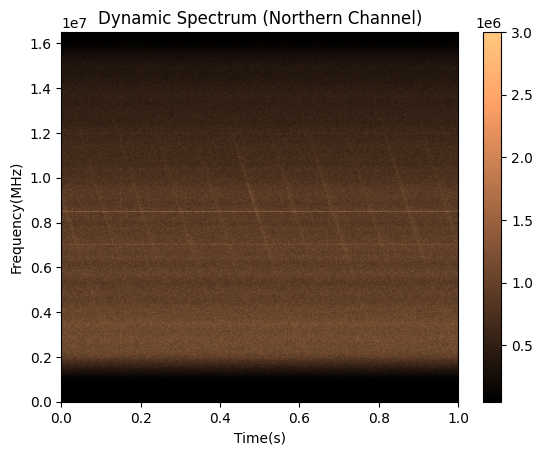

In [16]:
n1=np.array(voltage1)[:NFFT*int(N_spectra)]
n_resh=np.reshape(n1,(N_spectra,NFFT))
n_reshfft=np.fft.rfft(n_resh,axis=1)
n_reshpw=np.square(np.abs(n_reshfft))
freq=np.fft.rfftfreq(n_resh.size,N*dt)
freqmin,freqmax=-np.abs(freq).max(),np.abs(freq).max()
print(freqmin,freqmax)
plt.imshow(n_reshpw.transpose(),extent=[0,N_spectra*dt*2*N,0,16.5e6],aspect='auto',cmap="copper", vmin=5e4, vmax=3e6)
#plt.specgram(n, NFFT=512)

plt.grid(False)
plt.title('Dynamic Spectrum (Northern Channel)')
plt.xlabel('Time(s)')
plt.ylabel('Frequency(MHz)')
plt.colorbar()

-32226.561450956713 32226.561450956713


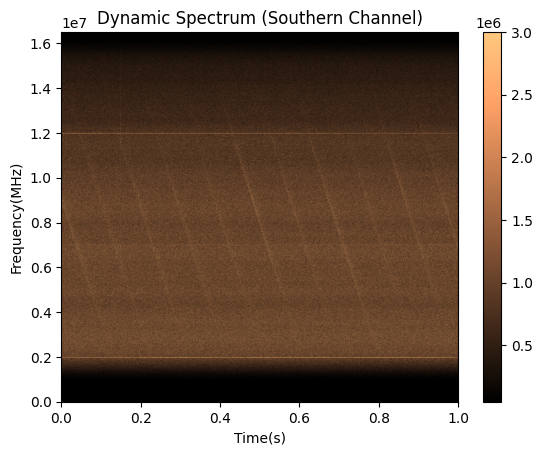

In [17]:
n2=np.array(voltage2)[:NFFT*int(N_spectra)]
n2_resh=np.reshape(n2,(N_spectra,NFFT))
n2_reshfft=np.fft.rfft(n2_resh,axis=1)
n2_reshpw=np.square(np.abs(n2_reshfft))
freq=np.fft.rfftfreq(n2_resh.size,N*dt)
freqmin,freqmax=-np.abs(freq).max(),np.abs(freq).max()
print(freqmin,freqmax)
plt.imshow(n2_reshpw.transpose(),extent=[0,N_spectra*dt*2*N,0,16.5e6],aspect='auto',cmap="copper", vmin=5e4, vmax=3e6)
#plt.specgram(n, NFFT=512)

plt.title('Dynamic Spectrum (Southern Channel)')
plt.xlabel('Time(s)')
plt.ylabel('Frequency(MHz)')
plt.colorbar()
plt.grid(False)

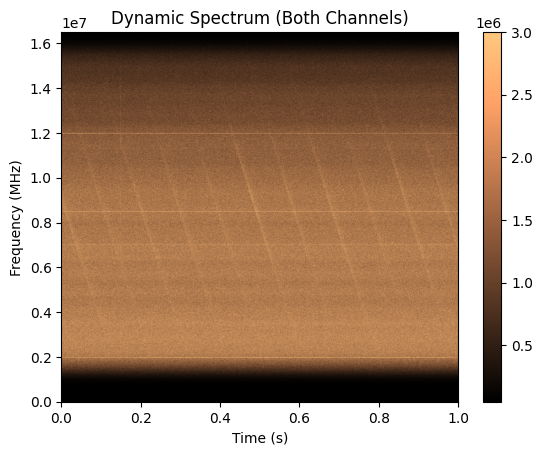

In [18]:
ns_sum=np.add(n_reshpw,n2_reshpw)

plt.imshow(ns_sum.transpose(),extent=[0,N_spectra*dt*2*N,0,16.5e6],aspect='auto',cmap="copper", vmin=5e4, vmax=3e6)
plt.grid(False)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (MHz)')
plt.title("Dynamic Spectrum (Both Channels)")
plt.colorbar()

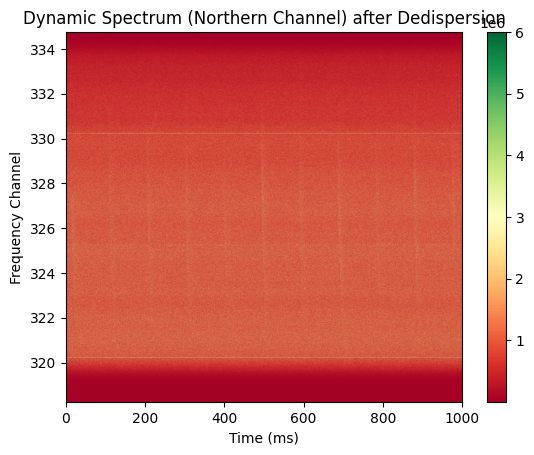

In [19]:
# ISM de dispersion

DM = 64.3
fdown,fup=(326.5-8.25)*10**6, (326.5+8.25)*10**6
s1 = np.transpose(np.square(np.abs(n_reshfft)))
s2 = np.transpose(np.square(np.abs(n2_reshfft)))
freq_bins = s1.shape[0]
fr = np.linspace(fdown, fup, freq_bins)

td = (4.148e3*DM*((1./326.5**2)- (1./(fr/1e6)**2)))  #time delay in ms


tshift =np.round((td)/(NFFT*dt))   #index corresponding to time delay
tshift=tshift.astype(int)
s1_dedisp = np.transpose(np.square(np.abs(n2_reshfft)))

for k, row in enumerate(s1_dedisp):
    s1_dedisp[k, :] = np.roll(s1_dedisp[k, :], -tshift[k])


plt.imshow(s1_dedisp, aspect='auto', extent=[0, N_spectra*dt*2*N*1000, fdown/1e6, fup/1e6], cmap='RdYlGn', vmax=6e6)
plt.title('Dynamic Spectrum (Northern Channel) after Dedispersion')
plt.xlabel('Time (ms)')
plt.ylabel('Frequency Channel')
plt.colorbar()
plt.grid(False)

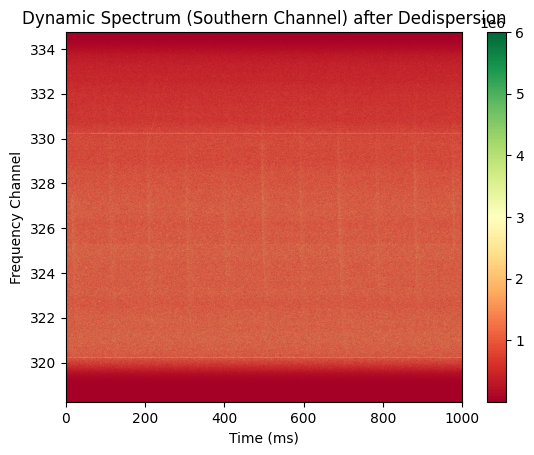

In [20]:

s2 = np.transpose(np.square(np.abs(n2_reshfft)))
freq_bins = s2.shape[0]
fr = np.linspace(fdown, fup, freq_bins)

td = (4.148e3*DM*((1./326.5**2)- (1./(fr/1e6)**2)))  #time delay in ms


tshift =np.round((td)/(NFFT*dt))   #index corresponding to time delay
tshift=tshift.astype(int)
s2_dedisp = np.transpose(np.square(np.abs(n2_reshfft)))

for k, row in enumerate(s2_dedisp):
    s2_dedisp[k, :] = np.roll(s2_dedisp[k, :], -tshift[k])


plt.imshow(s2_dedisp, aspect='auto', extent=[0, N_spectra*dt*2*N*1000, fdown/1e6, fup/1e6], cmap='RdYlGn', vmax=6e6)
plt.title('Dynamic Spectrum (Southern Channel) after Dedispersion')
plt.xlabel('Time (ms)')
plt.ylabel('Frequency Channel')
plt.colorbar()
plt.grid(False)

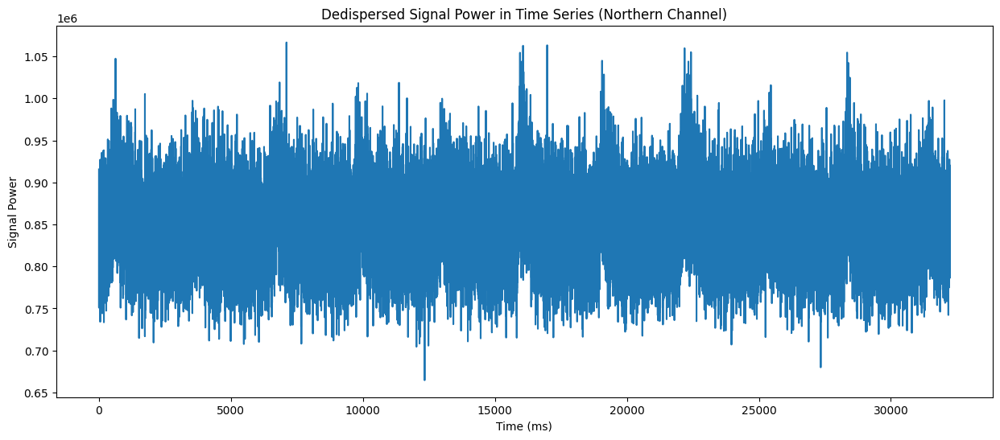

In [21]:
tsp = np.average(s1_dedisp, axis=0)
plt.figure(figsize=(15, 6))
plt.title('Dedispersed Signal Power in Time Series (Northern Channel)')
plt.xlabel('Time (ms)')
plt.ylabel('Signal Power')
plt.plot(tsp)

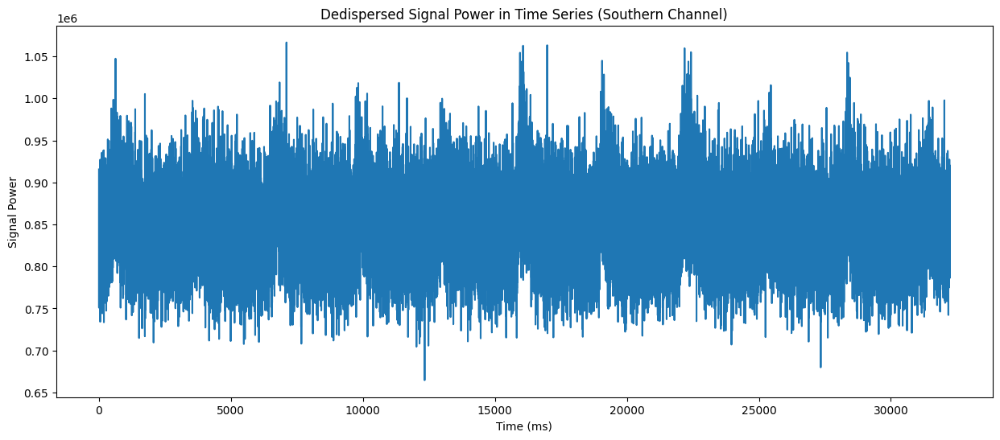

In [22]:
tsp = np.average(s2_dedisp, axis=0)
plt.figure(figsize=(15, 6))
plt.title('Dedispersed Signal Power in Time Series (Southern Channel)')
plt.xlabel('Time (ms)')
plt.ylabel('Signal Power')
plt.plot(tsp)

3081 10


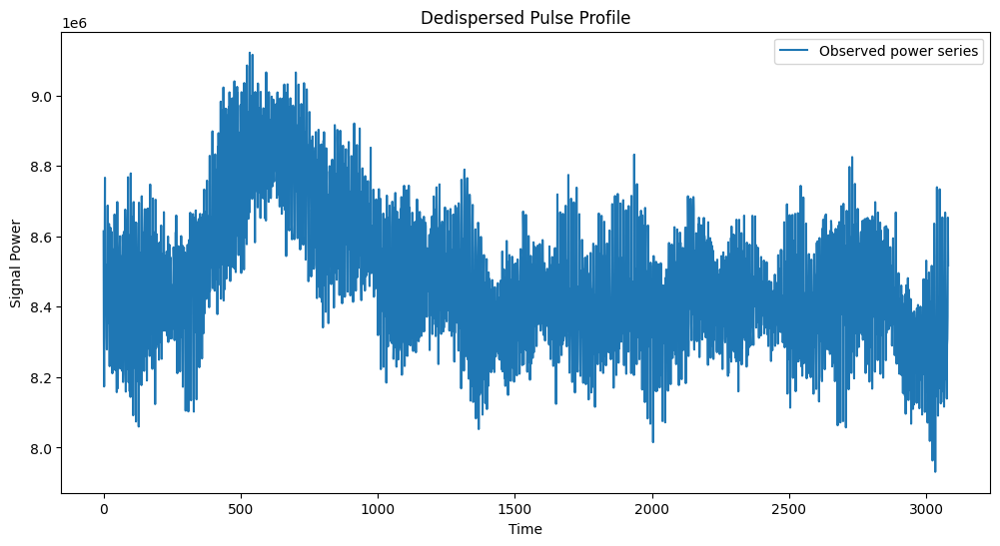

In [23]:
tperiod = 89e-3
fold_size = int(tperiod/(NFFT*dt))
bins = len(tsp)//fold_size
print(fold_size, bins)

pulse_profile = np.zeros(fold_size)


for k in range(fold_size):
    for j in range(bins):
        pulse_profile[k] += tsp[j*bins + k]

x = np.linspace(0, len(pulse_profile), len(pulse_profile), len(pulse_profile)*2)
mu = 350
sigma = 67
y= np.exp(-(x-mu)**2/(2*sigma**2))*1.4e6#/(np.sqrt(2*np.pi)*sigma)
plt.figure(figsize=(12, 6))
plt.title('Dedispersed Pulse Profile')
plt.xlabel('Time')
plt.ylabel('Signal Power')
plt.plot(pulse_profile, label='Observed power series')
#plt.plot(x, y+np.mean(pulse_profile)-0.015*1e7, label='Gaussian profile approximation', linewidth=3)
plt.legend()

189512.01358318178


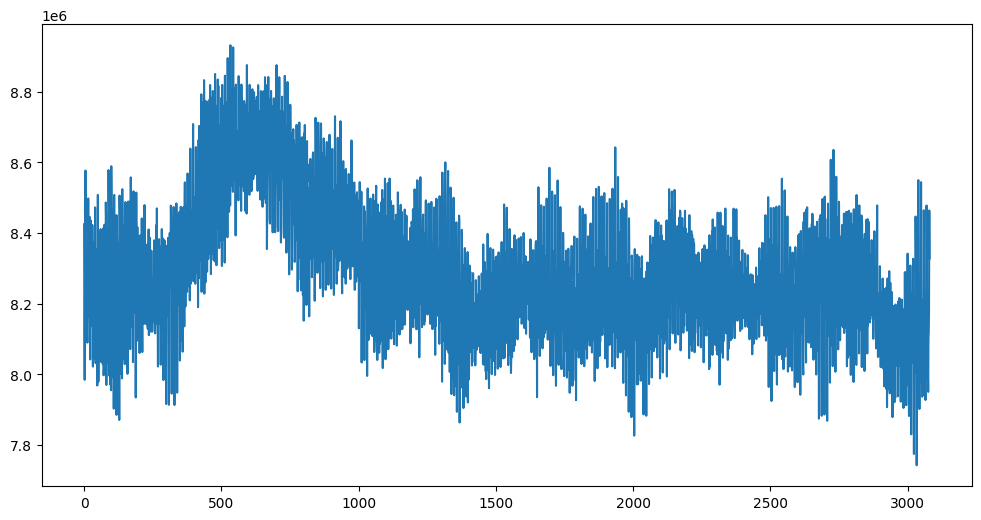

In [24]:
mu = np.mean(pulse_profile)
rms_error = np.sqrt(np.sum(pulse_profile**2-mu**2)/len(pulse_profile))
print(rms_error)
plt.figure(figsize=(12, 6))
plt.plot(pulse_profile-rms_error)